# Women’s neuroplasticity during gestation, childbirth, and postpartum

This Jupyter notebook provides the code used to plot the surface-based, vertex-wise maps showed in the figures of the manuscript entitled "Women’s neuroplasticity during gestation, childbirth, and postpartum" submitted to Nature Neuroscience for consideration for publication.

The necessary data to generate the figures is provided along with this notebook in the GitHub repository [neuromaternal/peripartum_neuroplasticity
](https://github.com/neuromaternal/peripartum_neuroplasticity)

In [1]:
# Importing necessary python modules and setting up seaborn plotting style
import nibabel as nib
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.lines import Line2D
from matplotlib.cm import get_cmap
from nilearn.plotting.surf_plotting import _colorbar_from_array
from nilearn import plotting
from nilearn import datasets
import os
import gc

sns.set_style('ticks')
sns.set_context('paper')

## Figure 1.b: Vertex-wise binary maps of the significant cortical group differences in Prg and Post sessions

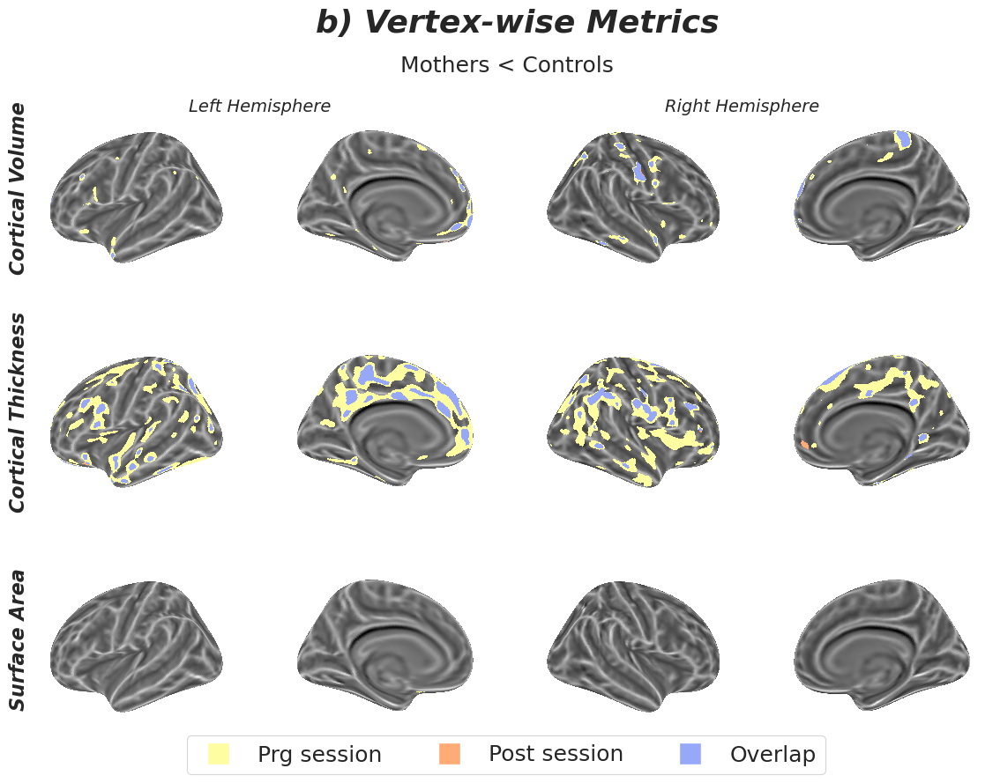

In [2]:
# Defining surface inputs and parameters to select the surface maps
fsaverage = datasets.fetch_surf_fsaverage('fsaverage') 
results_dir = os.path.join(os.getcwd(), 'main_data', 'without_covariates')

stat = 'FDRcorrP_across_hemi'
alpha = 0.05
one_minus_alpha = 1.0 - alpha

# Defining colormaps and threshold for the plots, and custom handles for the legend
col = ['#FFFDA2','#FFAB76','#98A8F8']
our_cmap = mcolors.LinearSegmentedColormap.from_list("", col)
thr_val = 1.0
custom_handles = [Line2D([], [], color='w', markerfacecolor=col[0], marker='s', markersize=18, label='Prg session'),
                  Line2D([], [], color='w', markerfacecolor=col[1], marker='s', markersize=18, label='Post session'),
                  Line2D([], [], color='w', markerfacecolor=col[2], marker='s', markersize=18, label='Overlap')]

# Plotting
fig1, ax1 = plt.subplots(3, 4, subplot_kw={'projection': '3d'}, figsize=(12,9))
fig1.subplots_adjust(wspace=0, hspace=0, top=0.88, right=0.97, left=0.03, bottom=0.03)
for w, measure in enumerate(["volume", "thickness", "area"]):
    for i, (hemi, hemi_name, surf, surf_bg) in enumerate(zip(["lh", "rh"],
                                                    ["left", "right"],
                                                    [fsaverage.infl_left, fsaverage.infl_right],
                                                    [fsaverage.curv_left, fsaverage.curv_right])):
        # Loading the fdr-pvalue maps 
        fdrcorrp_prg_map_name = f"{hemi}.{measure}_sm10_{stat}_contrast_sesPrg.mgh"
        fdrcorrp_post_map_name = f"{hemi}.{measure}_sm10_{stat}_contrast_sesPost.mgh"
        ses_prg_mfdrp_data = nib.load(f"{results_dir}/{fdrcorrp_prg_map_name}").get_fdata()
        ses_post_mfdrp_data = nib.load(f"{results_dir}/{fdrcorrp_post_map_name}").get_fdata()
        # Loading the sign maps 
        sgn_prg_map_name = f"{hemi}.{measure}_sm10_sgn_contrast_sesPrg.mgh"
        sgn_post_map_name = f"{hemi}.{measure}_sm10_sgn_contrast_sesPost.mgh"
        ses_prg_sgn_data = nib.load(f"{results_dir}/{sgn_prg_map_name}").get_fdata()
        ses_post_sgn_data = nib.load(f"{results_dir}/{sgn_post_map_name}").get_fdata()
        # Masking voxels with Controls > Mothers
        ses_prg_mfdrp_data[ses_prg_sgn_data > 0] = 0
        ses_post_mfdrp_data[ses_post_sgn_data > 0] = 0
        # Computing thresholded significance maps
        ses_prg_sig_map = np.where(ses_prg_mfdrp_data < one_minus_alpha, 0, 1)
        ses_post_sig_map = np.where(ses_post_mfdrp_data < one_minus_alpha, 0, 1)
        # Merge Pre and Post thresholded significance maps in one (1: Prg, 2: Post, 3: Overlap)
        surf_map = ses_prg_sig_map + ses_post_sig_map*2
        for j, view in enumerate(["lateral","medial"]):
            plotting.plot_surf_roi(surf,
                                   surf_map,
                                   hemi=hemi_name,
                                   view=view,
                                   vmin=1, vmax=3,
                                   bg_map=surf_bg,
                                   cmap=our_cmap,
                                   threshold=thr_val,
                                   colorbar=False,
                                   axes=ax1[w, 2*i+j])
            
fig1.text(0.32, 0.95, s='b) Vertex-wise Metrics', fontsize=26, fontweight='bold', style='italic')
fig1.text(0.40, 0.90, s='Mothers < Controls', fontsize=18)
fig1.text(0.03, 0.65, s='Cortical Volume', fontsize=16, rotation=90, fontweight='bold', style='italic')
fig1.text(0.03, 0.35, s='Cortical Thickness', fontsize=16, rotation=90, fontweight='bold', style='italic')
fig1.text(0.03, 0.10, s='Surface Area', fontsize=16, rotation=90, fontweight='bold', style='italic')
fig1.text(0.20, 0.85, s='Left Hemisphere', fontsize=14, style='italic')
fig1.text(0.65, 0.85, s='Right Hemisphere', fontsize=14, style='italic')

fig1.legend(handles=custom_handles, loc='lower center',
            bbox_to_anchor=(0.5,0), ncol=len(custom_handles), fontsize=18)
fig1.savefig('Figure-1b_lower-cortical-values-in-mothers-than-controls-in-prg-and-post-sessions-vertex-wise.png', dpi=300)

In [3]:
# Free RAM memory for next figure
fig1.clf()
gc.collect()

7867018

## Figure 2.b: Vertex-wise signed effect sizes maps of the group*session interaction

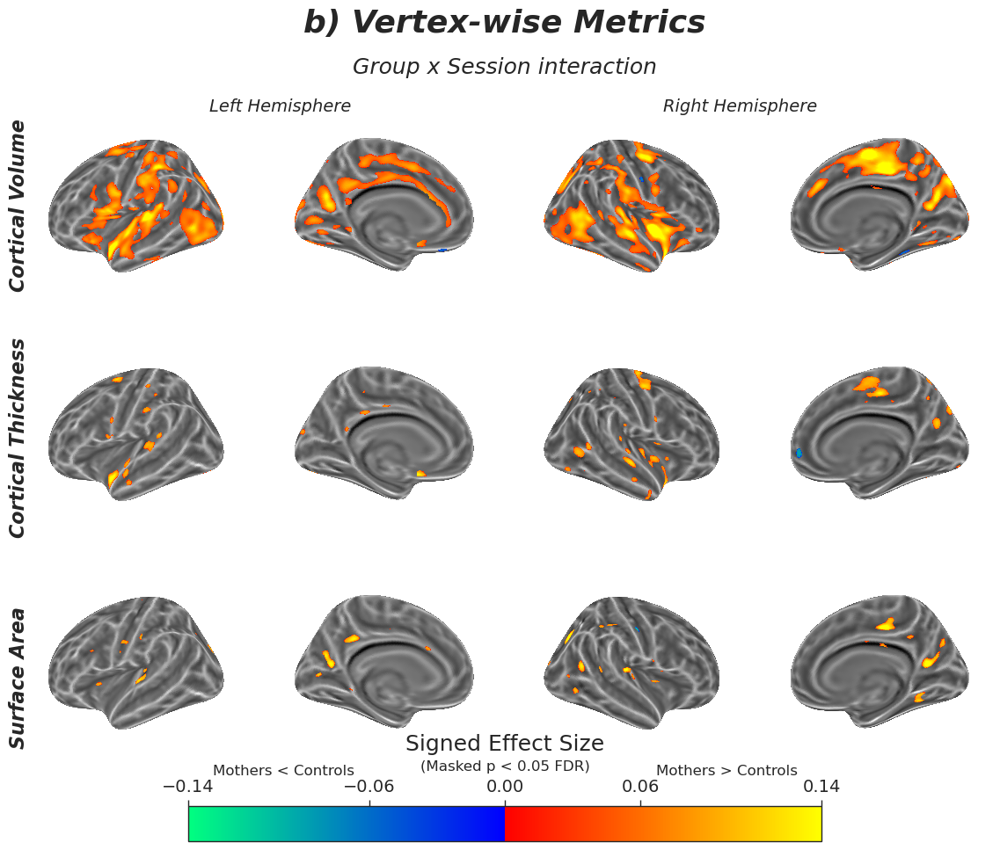

In [4]:
# Defining surface inputs and parameters to select the surface maps
fsaverage = datasets.fetch_surf_fsaverage('fsaverage') 
results_dir = os.path.join('.', 'main_data', 'without_covariates')

stat = 'FDRcorrP_across_hemi'
eff_size = 'partialETA2'
alpha = 0.05
one_minus_alpha = 1.0 - alpha

# Defining colormaps and limits for the visualization and colorbar

vmax_value = 0.14
threshold = 0.001
colors_pos = plt.cm.autumn(np.linspace(0, 1, 128))
colors_neg = plt.cm.winter(np.linspace(1, 0, 128))
colors = np.vstack((colors_neg, colors_pos))
our_cmap = mcolors.LinearSegmentedColormap.from_list('my_colormap', colors)

# Plotting
fig2, ax2 = plt.subplots(3, 4, subplot_kw={'projection': '3d'}, figsize=(12,10))
fig2.subplots_adjust(wspace=0, hspace=0, top=0.87, right=0.97, left=0.03, bottom=0.09)
for w, measure in enumerate(["volume", "thickness", "area"]):
    for i, (hemi, hemi_name, surf, surf_bg) in enumerate(zip(["lh", "rh"],
                                                    ["left", "right"],
                                                    [fsaverage.infl_left, fsaverage.infl_right],
                                                    [fsaverage.curv_left, fsaverage.curv_right])):
        # Loading the fdr-pvalue, effect size and sign maps 
        mfdrp_map_name = f"{hemi}.{measure}_sm10_{stat}_contrast_groupxses.mgh"
        eff_size_map_name = f"{hemi}.{measure}_sm10_{eff_size}_contrast_groupxses.mgh"
        sgn_map_name = f"{hemi}.{measure}_sm10_sgn_contrast_groupxses.mgh"
        long_mfdrp_data = nib.load(f"{results_dir}/{mfdrp_map_name}").get_fdata()
        long_eff_size_data = nib.load(f"{results_dir}/{eff_size_map_name}").get_fdata()
        long_sgn_data = nib.load(f"{results_dir}/{sgn_map_name}").get_fdata()
        # Computing thresholded signed effect size maps
        surf_map = long_sgn_data * long_eff_size_data * (long_mfdrp_data > one_minus_alpha)
        for j, view in enumerate(["lateral","medial"]):
            ex_plot= plotting.plot_surf_stat_map(surf,
                                                 surf_map,
                                                 hemi=hemi_name,
                                                 view=view,
                                                 threshold=threshold,
                                                 vmax=vmax_value,
                                                 bg_map=surf_bg,
                                                 cmap=our_cmap,
                                                 colorbar=False,
                                                 axes=ax2[w, 2*i+j])
            
fig2.text(0.50, 0.95, s='b) Vertex-wise Metrics', fontsize=26, fontweight='bold', style='italic', va='center', ha='center')
fig2.text(0.50, 0.90, s='Group x Session interaction', fontsize=18, style='italic', va='center', ha='center')
fig2.text(0.03, 0.65, s='Cortical Volume', fontsize=16, rotation=90, fontweight='bold', style='italic')
fig2.text(0.03, 0.37, s='Cortical Thickness', fontsize=16, rotation=90, fontweight='bold', style='italic')
fig2.text(0.03, 0.13, s='Surface Area', fontsize=16, rotation=90, fontweight='bold', style='italic')
fig2.text(0.22, 0.85, s='Left Hemisphere', fontsize=14, style='italic')
fig2.text(0.65, 0.85, s='Right Hemisphere', fontsize=14, style='italic')

# Colorbar setup
cbar_ax2 = fig2.add_axes([0.2, 0.02, 0.6, 0.04])
cb2 = _colorbar_from_array(np.random.random([0, 1]), vmax_value, None, {}, cmap=our_cmap)
fig_cb2 = fig2.colorbar(cb2, cax=cbar_ax2, ticks=[-vmax_value, -0.06, 0 , 0.06, vmax_value], orientation='horizontal')
cbar_ax2.tick_params(labelsize=14)
cbar_ax2.xaxis.set_label_position('top')
cbar_ax2.xaxis.set_ticks_position('top')
fig2.text(0.50, 0.13, s='Signed Effect Size', fontsize=18, va='center', ha='center')
fig2.text(0.50, 0.105, s='(Masked p < 0.05 FDR)', fontsize=12, va='center', ha='center')
fig2.text(0.29, 0.10, s='Mothers < Controls', fontsize=12, va='center', ha='center')
fig2.text(0.71, 0.10, s='Mothers > Controls', fontsize=12, va='center', ha='center')

fig2.savefig('Figure-2b_vertex-wise-signed-effect-sized-maps-of-the-groupsession-interaction.png', dpi=300)

In [5]:
# Free RAM memory for next figure
fig2.clf()
gc.collect()

7866891

## Figure 3: Spin-test for mean signed effect size in group*session for cortical volume maps over the large-scale functional networks

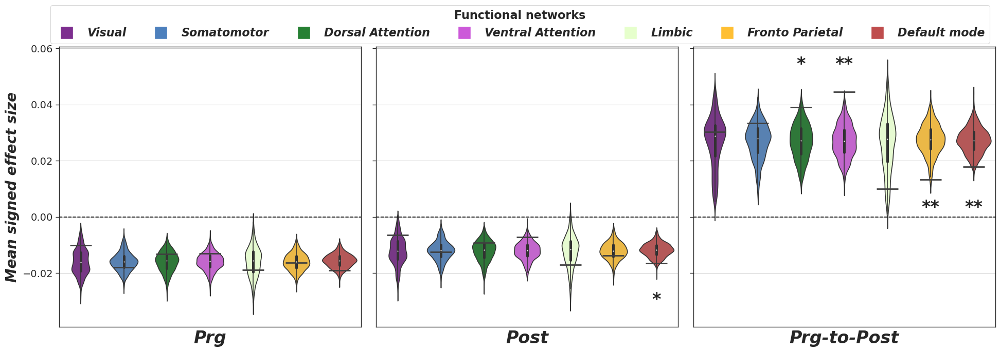

In [6]:
# Loading dataframe with precomputed data (see notebook ./compute_spin_tests_data.ipynb)
df_yeo_spin_test = pd.read_feather("./spin-test/yeo_spin_test_data.feather")
df_yeo_spin_test_pvalues = pd.read_feather("./spin-test/yeo_spin_test_pvalues.feather")

# Setting variables to custom visualization
no_rot = ['original']
yeo7net_order = ['visual', 'somatomotor', 'dorsal_attention', 'ventral_attention', 'limbic', 'fronto_parietal', 'default_mode']
yeo7net_labels = ['Visual', 'Somatomotor', 'Dorsal Attention', 'Ventral Attention', 'Limbic', 'Fronto Parietal', 'Default mode']
yeo7net_colors  =[(.49, 0.18, 0.56), (0.3, 0.5, 0.74), (0.15, 0.5, 0.2), (0.8, 0.35, .85),
                  (0.9, 1.0, 0.8), (1.0, 0.75, 0.2), (0.75, 0.3, 0.3)]
contrasts = ['sesPrg', 'sesPost', 'groupxses']
contrast_labels = ['Prg', 'Post', 'Prg-to-Post']

custom_handles = [Line2D([], [], color='w', markerfacecolor=c, marker='s', markersize=18, label=l) for c, l in zip(yeo7net_colors, yeo7net_labels)]

data_set = 'main_data'
model = 'without_covariates'
metric = 'volume'
map_metric = 'signed_partialETA2'

#Plotting
fig3, ax3 = plt.subplots(1, 3, figsize=(20,7), sharey=True)
fig3.subplots_adjust(wspace=0.05, top=0.85, right=0.97, left=0.06, bottom=0.07)
for c, contrast in enumerate(contrasts):
     df_plot = df_yeo_spin_test.query("data_set==@data_set and model==@model and contrast==@contrast \
                                       and metric==@metric and map_metric==@map_metric")
     sns.swarmplot(x='parcel_name', y='map_value',
                   data=df_plot.query("rotation==@no_rot"),
                   order=yeo7net_order,
                   size=30, linewidth=2, marker="_", ax=ax3[c])
     sns.violinplot(x='parcel_name', y='map_value',
                    order=yeo7net_order, palette=yeo7net_colors,
                    data=df_plot.query("rotation!=@no_rot"),
                    saturation=0.8, ax=ax3[c])
     ax3[c].set_xlabel('{}'.format(contrast_labels[c]), fontsize=24, weight='bold', style='italic')
     ax3[c].tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
     ax3[c].tick_params(labelsize=14)
     # ax3[c].set_ylim(ymin, ymax)
     ax3[c].grid(axis='y')
     ax3[c].axhline(y = 0, ls='--', color='k')
# Marking significative results
ymin, ymax = ax3[0].get_ylim()
perc_pos_sym = [0.50, 0.50, 0.08]
perc_neg_sym = [0.08, 0.08, 0.41]
d_perc_sym = 0.0
for c, contrast in enumerate(contrasts):  
     df_plot_pvalues = df_yeo_spin_test_pvalues.query("data_set==@data_set and model==@model and contrast==@contrast \
                                                       and metric==@metric and map_metric==@map_metric")  
     for j, p in enumerate(yeo7net_order):
         p_pos = df_plot_pvalues.query('parcel_name==@p and tail=="positive"').p_value.values[0]
         p_neg = df_plot_pvalues.query('parcel_name==@p and tail=="negative"').p_value.values[0]
         p_val = min(p_pos, p_neg)
         if p_pos == p_val:
              y_sym = ymax - (perc_pos_sym[c] + d_perc_sym*(j % 2))*(ymax-ymin) 
         if p_neg == p_val:
              y_sym = ymin + (perc_neg_sym[c] - d_perc_sym*(j % 2))*(ymax-ymin)
         if p_val < 0.05:
             symbol = r"*"
             if  p_val < 0.01:
                  symbol = r"**"
             ax3[c].text(j, y_sym, symbol, horizontalalignment='center', fontsize=24, weight='bold')
# Setting legend and labels
ax3[0].legend(title='Functional networks', handles=custom_handles, ncols=7, 
                      bbox_to_anchor=(3.1, 1.17, 0.0, 0.0), prop = {'weight':'bold','size': 16, 'style': 'italic'},
                      title_fontproperties={'weight':'bold', 'size': 16})
ax3[0].set_ylabel(r'Mean signed effect size',  fontsize=20, weight='bold', style='italic')

fig3.savefig(f'Figure-3_Yeo-7networks-spin-test-signed-effect-size-for-group-ses-interaction-in-{metric}-maps.png', dpi=300)

In [7]:
# Free RAM memory for next figure
fig3.clf()
gc.collect()

10707

## Figure 4: Comparison of vertex-wise effect sizes obtained with main data and replication data

### Figure 4.a: Group differences (Prg differences)

/tmp/ipykernel_159770/2974639180.py:74: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cb4a = _colorbar_from_array(np.random.random([0, 1]), vmax_value, thr_val, {}, cmap=get_cmap(cmap_name))
/tmp/ipykernel_159770/2974639180.py:74: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cb4a = _colorbar_from_array(np.random.random([0, 1]), vmax_value, thr_val, {}, cmap=get_cmap(cmap_name))
/tmp/ipykernel_159770/2974639180.py:74: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cb4a = _color

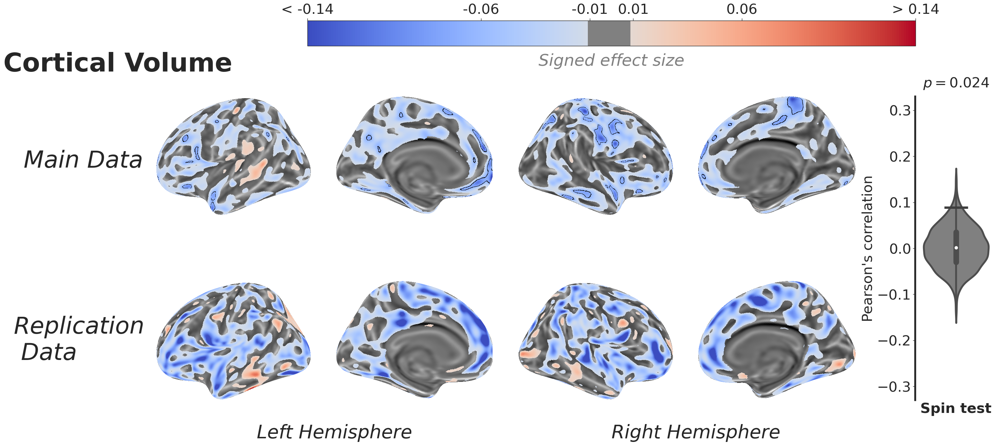

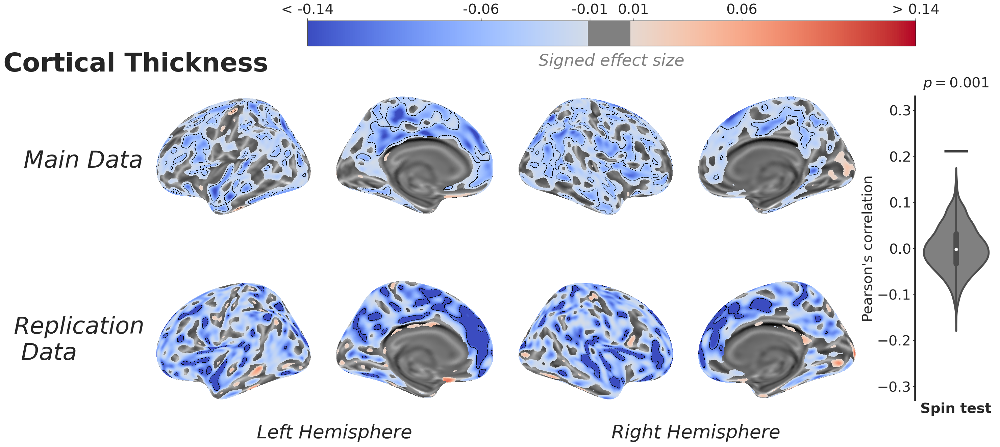

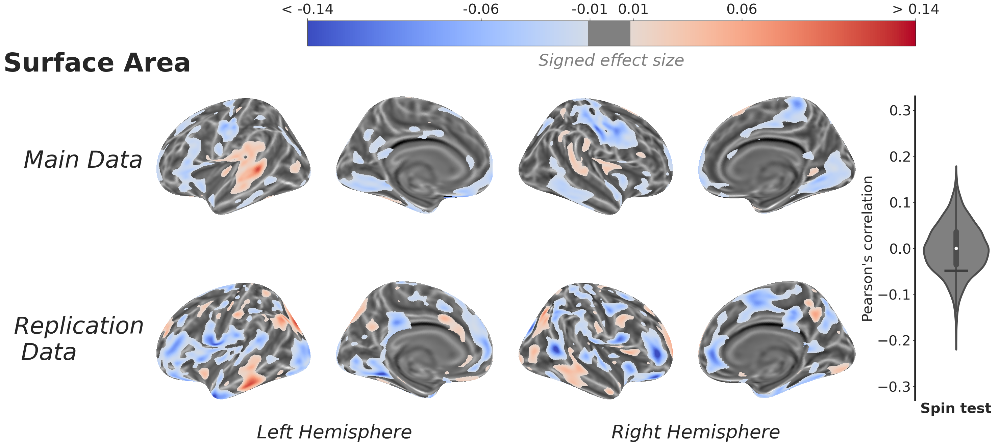

In [8]:
draft = False
save_plots = True
plot_contours = True
fsaverage = datasets.fetch_surf_fsaverage('fsaverage') 
main_data_dir = os.path.join(os.getcwd(), 'main_data', 'without_covariates')
replication_data_dir = os.path.join(os.getcwd(), 'replication_data', 'without_covariates')

stat = 'FDRcorrP_across_hemi'
eff_size = 'partialETA2'
alpha = 0.05
one_minus_alpha = 1.0 - alpha

thr_val = 0.01
vmax_value = 0.14

contrast = 'sesPrg'
contrast_label = 'Prg'

cmap_name='coolwarm'
measures = ["volume", 'thickness', 'area']
titles = ['Cortical Volume', 'Cortical Thickness', 'Surface Area']

df_repl_spin_test = pd.read_feather("./spin-test/replication_spin_test_data.feather")
df_repl_spin_test_pvalues = pd.read_feather("./spin-test/replication_spin_test_pvalues.feather")

for w, measure in enumerate(measures):
    fig4a, ax4a = plt.subplots(2, 4, subplot_kw={'projection': '3d'}, figsize=(30, 15))
    fig4a.subplots_adjust(wspace=-0.1, hspace=-0.1, top=0.88, right=0.86)
    if not draft:
        for i, (hemi, hemi_name, surf, surf_bg) in enumerate(zip(["lh", "rh"],
                                                                 ["left", "right"],
                                                                 [fsaverage.infl_left, fsaverage.infl_right],
                                                                 [fsaverage.curv_left, fsaverage.curv_right])):
            maps = []
            contours= []
            #We load the fdr-corr p-value and (signed) effect size maps for both datasets
            for dd in [main_data_dir, replication_data_dir]: 
                map_file = f'{dd}/{hemi}.{measure}_sm10_{eff_size}_contrast_{contrast}.mgh'
                stat_file = f'{dd}/{hemi}.{measure}_sm10_{stat}_contrast_{contrast}.mgh'
                sgn_file = f'{dd}/{hemi}.{measure}_sm10_sgn_contrast_{contrast}.mgh'
                maps.append(nib.load(map_file).get_fdata()*nib.load(sgn_file).get_fdata())            
                contours.append(nib.load(stat_file).get_fdata() > one_minus_alpha)
            for j, view in enumerate(['lateral', 'medial']):
                for k, (map, con) in enumerate(zip(maps, contours)):
                    stat_plot = plotting.plot_surf_stat_map(surf,
                                                            map,
                                                            hemi=hemi_name,
                                                            view=view,
                                                            vmax=vmax_value,
                                                            bg_map=surf_bg,
                                                            cmap=cmap_name,
                                                            threshold=thr_val,
                                                            colorbar=False,
                                                            axes=ax4a.flat[4*k+2*i+j]);
                    if plot_contours:
                        try:
                            plotting.plot_surf_contours(surf,
                                                        con,
                                                        labels=['p-FDR < 0.05'],
                                                        levels=[1],
                                                        figure=stat_plot,
                                                        legend=False,
                                                        colors=['k'],
                                                        axes=ax4a.flat[4*k+2*i+j]);
                        except:
                            pass
    fig4a.text(0,0.85,s=titles[w], fontsize=55, fontweight='bold')
    fig4a.text(0.02,0.66,s='Main Data', fontsize=50, style='italic')
    fig4a.text(0.01,0.28,s='Replication\n Data', fontsize=50,  style='italic')
    fig4a.text(0.25,0.125, s='Left Hemisphere', fontsize=40, style='italic')
    fig4a.text(0.60,0.125, s='Right Hemisphere', fontsize=40, style='italic')
    #Common colorbar
    cbar_ax4a = fig4a.add_axes([0.30, 0.9, 0.6, 0.05])
    cb4a = _colorbar_from_array(np.random.random([0, 1]), vmax_value, thr_val, {}, cmap=get_cmap(cmap_name))
    fig_cbsm5a = fig4a.colorbar(cb4a, cax=cbar_ax4a, ticks=[-vmax_value, -0.06, -thr_val, thr_val, 0.06, vmax_value], orientation='horizontal')
    fig_cbsm5a.ax.set_xticklabels([f'< -{vmax_value:.2f}', '-0.06', f'-{thr_val:.2f}', f'{thr_val:.2f}', '0.06', f'> {vmax_value:.2f}'])
    fig_cbsm5a.ax.xaxis.set_ticks_position("top")
    for t in fig_cbsm5a.ax.get_xticklabels():
        t.set_fontsize(30)
    fig4a.text(0.60, 0.87, "Signed effect size", va='center', ha='center', fontsize=35, color='gray', style='italic')
    #Spin-test plot
    st_ax4a = fig4a.add_axes([0.90, 0.2, 0.08, 0.6])
    df_st = df_repl_spin_test.query("model=='without_covariates' and contrast==@contrast \
                                     and metric==@measure and map_metric=='signed_partialETA2' and corr_function=='pearsonr'")
    sns.violinplot(x='metric', y='corr_metric', data=df_st.query("rotation!='original'"), ax=st_ax4a, linewidth=4, color='gray')
    sns.swarmplot(x='metric', y='corr_metric', data=df_st.query("rotation=='original'"), ax=st_ax4a, size=50, linewidth=5, marker="_")
    sns.despine(offset=1, ax=st_ax4a)
    st_ax4a.spines['bottom'].set_visible(False)
    st_ax4a.spines['left'].set_linewidth(4)
    st_ax4a.set_ylabel("Pearson's correlation", fontsize=30)
    st_ax4a.set_xlabel("Spin test", fontsize=30, fontweight='bold')
    st_ax4a.set_ylim(-0.33, 0.33)
    st_ax4a.set_xticks([])
    for t in st_ax4a.get_yticklabels():
        t.set_fontsize(30)
    p_val = df_repl_spin_test_pvalues.query(("model=='without_covariates' and contrast==@contrast and \
                                              metric==@measure and map_metric=='signed_partialETA2' and \
                                              corr_function=='pearsonr'")).p_value.values[0]
    if p_val < 0.1:
        symbol = r"$p = {:0.3f}$".format(p_val)
        st_ax4a.text(0, 0.35, symbol, horizontalalignment='center', fontsize=30)
    if save_plots:
        fig4a.savefig('Figure-4a_replication-prg-effect_size_{}.png'.format(measure), facecolor='white')

In [9]:
# Free RAM memory for next figure
fig4a.clf()
gc.collect()

15775760

### Figure 4.b: Group*Session interaction (Prg-to-Post changes)

/tmp/ipykernel_159770/217780029.py:75: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cb4b = _colorbar_from_array(np.random.random([0, 1]), vmax_value, thr_val, {}, cmap=get_cmap(cmap_name))
/tmp/ipykernel_159770/217780029.py:75: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cb4b = _colorbar_from_array(np.random.random([0, 1]), vmax_value, thr_val, {}, cmap=get_cmap(cmap_name))
/tmp/ipykernel_159770/217780029.py:75: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cb4b = _colorbar

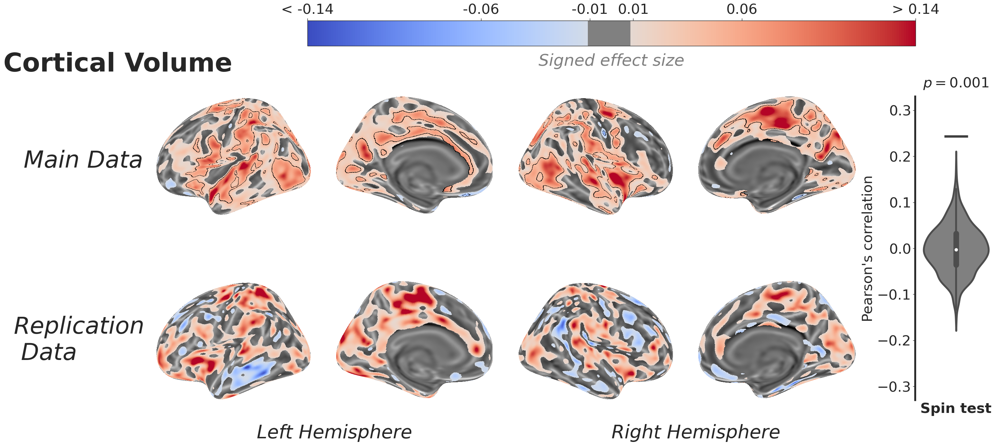

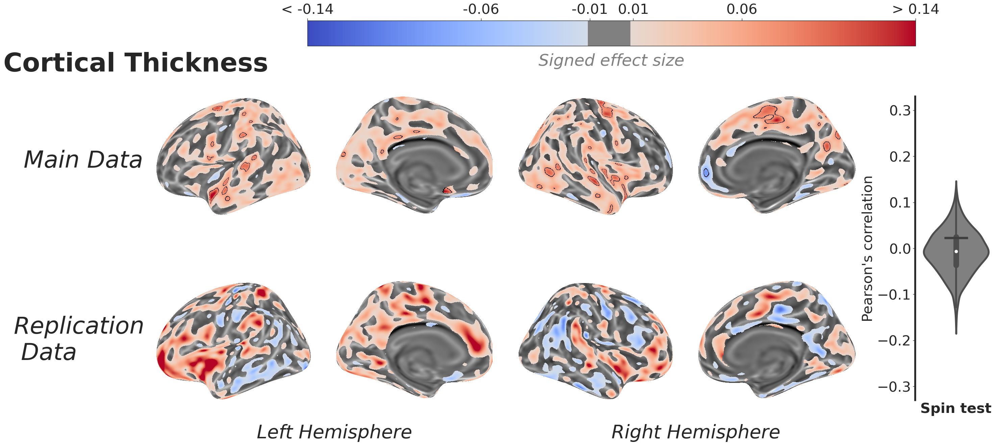

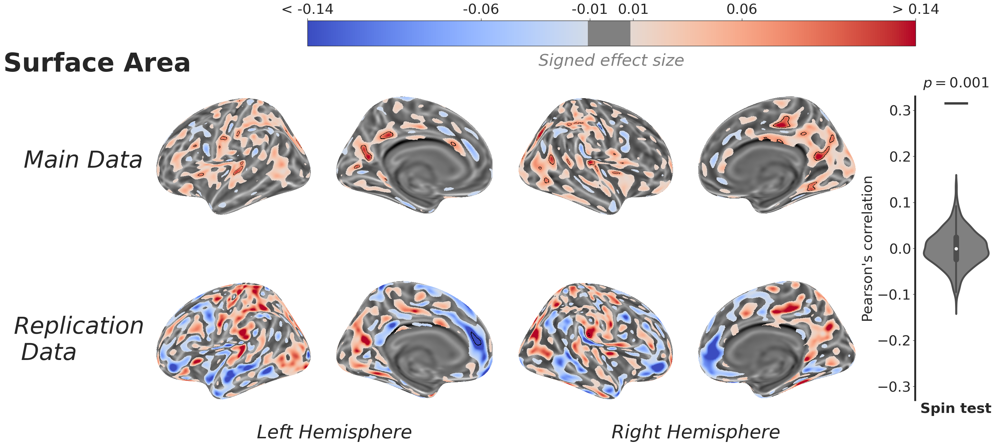

In [10]:
draft = False
save_plots = True
plot_contours = True
fsaverage = datasets.fetch_surf_fsaverage('fsaverage') 
main_data_dir = os.path.join(os.getcwd(), 'main_data', 'without_covariates')
replication_data_dir = os.path.join(os.getcwd(), 'replication_data', 'without_covariates')

stat = 'FDRcorrP_across_hemi'
eff_size = 'partialETA2'
alpha = 0.05
one_minus_alpha = 1.0 - alpha

thr_val = 0.01
vmax_value = 0.14

contrast = 'groupxses'
contrast_label = 'Group x Session'

cmap_name='coolwarm'
measures = ["volume", 'thickness', 'area']
titles = ['Cortical Volume', 'Cortical Thickness', 'Surface Area']

df_repl_spin_test = pd.read_feather("./spin-test/replication_spin_test_data.feather")
df_repl_spin_test_pvalues = pd.read_feather("./spin-test/replication_spin_test_pvalues.feather")

for w, measure in enumerate(measures):
    fig4b, ax4b = plt.subplots(2, 4, subplot_kw={'projection': '3d'}, figsize=(30, 15))
    fig4b.subplots_adjust(wspace=-0.1, hspace=-0.1, top=0.88, right=0.86)
    if not draft:
        for i, (hemi, hemi_name, surf, surf_bg) in enumerate(zip(["lh", "rh"],
                                                                 ["left", "right"],
                                                                 [fsaverage.infl_left, fsaverage.infl_right],
                                                                 [fsaverage.curv_left, fsaverage.curv_right])):
            maps = []
            contours= []
            #We load the fdr-corr p-value and (signed) effect size maps for both datasets
            for dd in [main_data_dir, replication_data_dir]: 
                map_file = f'{dd}/{hemi}.{measure}_sm10_{eff_size}_contrast_{contrast}.mgh'
                stat_file = f'{dd}/{hemi}.{measure}_sm10_{stat}_contrast_{contrast}.mgh'
                sgn_file = f'{dd}/{hemi}.{measure}_sm10_sgn_contrast_{contrast}.mgh'
                maps.append(nib.load(map_file).get_fdata()*nib.load(sgn_file).get_fdata())            
                contours.append(nib.load(stat_file).get_fdata() > one_minus_alpha)
            for j, view in enumerate(['lateral', 'medial']):
                for k, (map, con) in enumerate(zip(maps, contours)):
                    stat_plot = plotting.plot_surf_stat_map(surf,
                                                            map,
                                                            hemi=hemi_name,
                                                            view=view,
                                                            vmax=vmax_value,
                                                            bg_map=surf_bg,
                                                            cmap=cmap_name,
                                                            threshold=thr_val,
                                                            colorbar=False,
                                                            axes=ax4b.flat[4*k+2*i+j]);
                    if plot_contours:
                        try:
                            plotting.plot_surf_contours(surf,
                                                        con,
                                                        labels=['p-FDR < 0.05'],
                                                        levels=[1],
                                                        figure=stat_plot,
                                                        legend=False,
                                                        colors=['k'],
                                                        axes=ax4b.flat[4*k+2*i+j]);
                        except:
                            pass
    fig4b.text(0,0.85,s=titles[w], fontsize=55, fontweight='bold')
    fig4b.text(0.02,0.66,s='Main Data', fontsize=50, style='italic')
    fig4b.text(0.01,0.28,s='Replication\n Data', fontsize=50,  style='italic')
    fig4b.text(0.25,0.125, s='Left Hemisphere', fontsize=40, style='italic')
    fig4b.text(0.60,0.125, s='Right Hemisphere', fontsize=40, style='italic')
    #figsm5a.subplots_adjust()
    #Common colorbar
    cbar_ax4b = fig4b.add_axes([0.30, 0.9, 0.6, 0.05])
    cb4b = _colorbar_from_array(np.random.random([0, 1]), vmax_value, thr_val, {}, cmap=get_cmap(cmap_name))
    fig_cb4b = fig4b.colorbar(cb4b, cax=cbar_ax4b, ticks=[-vmax_value, -0.06, -thr_val, thr_val, 0.06, vmax_value], orientation='horizontal')
    fig_cb4b.ax.set_xticklabels([f'< -{vmax_value:.2f}', '-0.06', f'-{thr_val:.2f}', f'{thr_val:.2f}', '0.06', f'> {vmax_value:.2f}'])
    fig_cb4b.ax.xaxis.set_ticks_position("top")
    for t in fig_cb4b.ax.get_xticklabels():
        t.set_fontsize(30)
    fig4b.text(0.60, 0.87, "Signed effect size", va='center', ha='center', fontsize=35, color='gray', style='italic')
    #Spin-test plot
    st_ax4b = fig4b.add_axes([0.90, 0.2, 0.08, 0.6])
    df_st = df_repl_spin_test.query("model=='without_covariates' and contrast==@contrast \
                                     and metric==@measure and map_metric=='signed_partialETA2' and corr_function=='pearsonr'")
    sns.violinplot(x='metric', y='corr_metric', data=df_st.query("rotation!='original'"), ax=st_ax4b, linewidth=4, color='gray')
    sns.swarmplot(x='metric', y='corr_metric', data=df_st.query("rotation=='original'"), ax=st_ax4b, size=50, linewidth=5, marker="_")
    sns.despine(offset=1, ax=st_ax4b)
    st_ax4b.spines['bottom'].set_visible(False)
    st_ax4b.spines['left'].set_linewidth(4)
    st_ax4b.set_ylabel("Pearson's correlation", fontsize=30)
    st_ax4b.set_xlabel("Spin test", fontsize=30, fontweight='bold')
    st_ax4b.set_ylim(-0.33, 0.33)
    st_ax4b.set_xticks([])
    for t in st_ax4b.get_yticklabels():
        t.set_fontsize(30)
    p_val = df_repl_spin_test_pvalues.query(("model=='without_covariates' and contrast==@contrast and \
                                              metric==@measure and map_metric=='signed_partialETA2' and \
                                              corr_function=='pearsonr'")).p_value.values[0]
    if p_val < 0.1:
        symbol = r"$p = {:0.3f}$".format(p_val)
        st_ax4b.text(0, 0.35, symbol, horizontalalignment='center', fontsize=30)
    if save_plots:
        fig4b.savefig('Figure-4b_replication-interaction-effect_size_{}.png'.format(measure), facecolor='white')

In [11]:
# Free RAM memory for next figure
fig4b.clf()
gc.collect()

15775758